<a href="https://colab.research.google.com/github/slesarev-hub/Bayesian-classifier/blob/master/compression_memory_evaluation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set
import csv
import copy
import sys
import scipy

In [20]:
!git clone https://github.com/slesarev-hub/ssb-dbgen
%cd ssb-dbgen
!ls
!cmake . && cmake --build .

Cloning into 'ssb-dbgen'...
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 594 (delta 0), reused 0 (delta 0), pack-reused 590
Receiving objects: 100% (594/594), 251.33 KiB | 13.23 MiB/s, done.
Resolving deltas: 100% (370/370), done.
/content/ssb-dbgen/ssb-dbgen
CMakeLists.txt	dists.dss  doc	README.md  src
-- The C compiler identification is GNU 7.4.0
-- Check for working C compiler: /usr/bin/cc
-- Check for working C compiler: /usr/bin/cc -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Build type: Release
-- Looking for sys/types.h
-- Looking for sys/types.h - found
-- Looking for stdint.h
-- Looking for stdint.h - found
-- Looking for stddef.h
-- Looking for stddef.h - found
-- Check size of long long
-- Check size of long long - done
-- Check size of long
-- Check size of long - done

In [21]:
# -s - scale factor
!./dbgen -v -s 2

SSB (Star Schema Benchmark) Population Generator (Version 1.0.0)
Copyright Transaction Processing Performance Council 1994 - 2000
Generating data for part table [pid: 1]: /|-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\||/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\||/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-|\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\|/-\

[Super-Scalar RAM-CPU Cache Compression](https://paperhub.s3.amazonaws.com/7558905a56f370848a04fa349dd8bb9d.pdf)

**Prefix Suppression (PS)** - for numeric data if actual values tend to be significantly smaller than the largest value of the type 

**Frame Of Reference (FOR)** - for each disk block
the minimum $min_C$ value for the numeric column C, and
then stores all column values $c[i]$ as $c[i] − min_C$ in an integer of only $log_2(max_C −min_C +1)$ bits

**Dictionary Compression**

**Delta Compression**

**Patched Frame-of-Reference (PFOR)** - the small integers are
positive offsets from a base value. One (possibly negative) base value is used per disk block, values below base stored as exceptions

**PFOR-DELTA** - decompression consists of PFOR-decompression, and then computing the running sum on the result.

**PDICT** - integer codes
refer to a position in an array of values

[Simple Solutions
for Compressed Execution
in Vectorized Database System](https://homepages.cwi.nl/~boncz/msc/2011-AlaLuszczak.pdf)

[The Implementation and Performanceof Compressed Databases](https://www.researchgate.net/publication/2765968_The_Implementation_and_Performance_of_Compressed_Databases)

[Integrating Compression and Execution in
Column-Oriented Database Systems](http://db.csail.mit.edu/projects/cstore/abadisigmod06.pdf)

------------
[Query Optimization In Compressed Database Systems](http://www.cs.cornell.edu/zhychen/paper/sigmod01-camera.pdf)

**ps** и **for** оценщики памяти  

In [0]:
def align_to_byte(n_bits):
  return (n_bits + 7) // 8

def byte_size_of(number):
  return align_to_byte(len(format(number, 'b')))

In [0]:
# Super-Scalar RAM-CPU Cache Compression
# minimum BY BLOCK + [offsets from minimum]
def for_volume(raw_value_size, column):
  cmprs_value_size = byte_size_of(np.max(column) - np.min(column))
  # 1 byte to encode compressed value size, one value is minimum, so len = len - 1
  return raw_value_size + 1 + cmprs_value_size * (len(column) - 1)

# Super-Scalar RAM-CPU Cache Compression
# размер сжатой колонки в байтах при выделении общего префикса у подмассива
# строки и числа
def ps_volume(raw_value_size, column):
  str_column = column.astype(str)
  m = np.min([len(s) for s in str_column]) # бинпоиск по префиксам в строке мин длины
  low, high = 0, m
  prefix = ""
  while low <= high:
    mid = low + (high - low)//2
    if np.all([s[low:mid+1] == str_column[0][low:mid+1] for s in str_column]):
      prefix += str_column[0][low:mid+1]
      low = mid + 1
    else:
      high = mid - 1
  if len(prefix) == 0 and isinstance(column[0], str):
    compressed_volume = len(column[0])*len(column)
  elif len(prefix) == 0:
    compressed_volume = byte_size_of(np.max(column))*len(column)
  elif isinstance(column[0], str):
    compressed_volume = 1 + (len(column[0])-len(prefix))*len(column) #sizeof(char) = 1
  else:
    compressed_volume = 1+ byte_size_of(int(str(np.max(column))[len(prefix):]))*len(column)
  return compressed_volume

# Super-Scalar RAM-CPU Cache Compression
def delta_volume(raw_value_size, column):
  max_delta = max(column[i] - column[i - 1] for i in range(1, len(column)))
  # delta can be negative, while the absolute value are of interest for us
  min_delta = min(column[i] - column[i - 1] for i in range(1, len(column)))
  # as in for_volumn, but we hate to store min_delta together with the column[0] elemnt
  # therefor, 2 * raw_value_size
  return 2 * raw_value_size + 1 + byte_size_of(max_delta - min_delta) * (len(column) - 1)

# Super-Scalar RAM-CPU Cache Compression
def pfor_delta_volume(raw_value_size, column):
  d_column = [column[i]-column[i-1] for i in range(1,len(column))]
  d_column.insert(0, column[0])
  return pfor_volume(raw_value_size, np.array(d_column))

# Super-Scalar RAM-CPU Cache Compression
def dict_volume(raw_value_size, column):
  dict_values = np.unique(column)
  # compute dictionary volume
  # dictionary is a structure with fast "get value by key"
  # assume that it is array _keys_: i --> offset of i-th value and a memory buffer with values
  # then value with key _i_ is in _buffer + keys[i]_ 
  # assume that offset is 32bit (4byte) len. Sometimes it can be significantly smaller,
  # you can adjust the formula if you want
  # for an array of integers, we can store actual values instead of offsets
  offset_size = 4
  if not isinstance(column[0], np.int64):
    dict_size = sum(len(c) for c in dict_values) + len(dict_values) * offset_size 
  else:
    dict_size = len(dict_values) * byte_size_of(np.max(dict_values))
  dict_key_size = byte_size_of(len(dict_values))
  return len(column) * dict_key_size + dict_size

bit_width = {'pfor' : 24, 'pdict' : 24}
  
# Super-Scalar RAM-CPU Cache Compression
# compress [base_min, base_max] into 24 bit values, other values stay uncompressed
def pfor_volume(raw_value_size, column):
  unique = np.unique(column)
  compressed_volume = len(column)*raw_value_size
  b_ans = 0;
  for b in range(1,bit_width['pfor']):
    for base in unique:
      not_compressed = [val for val in column if val < base or val > base + (1 << (b + 1)) - 1]
      if len(not_compressed) == 0:
        not_compressed_volume = 0
      else:
        not_compressed_volume = len(not_compressed)*raw_value_size
      #if compressed_volume > byte_size_of(len(column)) + not_compressed_volume + (len(column)-len(not_compressed))*align_to_byte(b):
      #  b_ans = b
      compressed_volume = min(compressed_volume, byte_size_of(len(column)) + not_compressed_volume + (len(column)-len(not_compressed))*align_to_byte(b))
  #print(b_ans)
  return compressed_volume

# Super-Scalar RAM-CPU Cache Compression
def pdict_volume(raw_value_size, column):
  col = copy.deepcopy(column)
  unique, counts = np.unique(column, return_counts=True)
  uncompressed_counts = 0
  uncompressed = []
  while byte_size_of(len(unique)) > align_to_byte(bit_width['pdict']):    
    uncompressed.append(unique[-1]) 
    uncompressed_counts += counts[-1]
    col = np.array([c for c in col  if c != unique[-1]])
    unique = unique[:-1]
    counts = counts[:-1]
  if uncompressed_counts == 0:
    compressed_volume = dict_volume(raw_value_size, col)
  else:
    compressed_volume = dict_volume(raw_value_size, col) + byte_size_of(max(uncompressed))*uncompressed_counts
  return compressed_volume

In [0]:
def array2string(a):
  s = ""
  for c in a:
    s += str(c)
  return s

In [0]:
# Integrating Compression and Execution in Column-Oriented Database Systems
def bit_vector_volume(raw_value_size, column):
  return len(np.unique(column))*(byte_size_of(np.max(column)) + byte_size_of(len(column)))

# Integrating Compression and Execution in Column-Oriented Database Systems
def bit_dict_volume(raw_value_size, column):
  unique = np.unique(column)
  #print(unique)
  val_bits = len(format(len(unique), 'b'))
  #print(val_bits)
  dict_val_size = [8, 16, 24, 32, 40]
  dict_val_size = [size for size in dict_val_size if size >= val_bits]
  #print(dict_val_size)
  compressed_cnt = [bts//val_bits for bts in dict_val_size]
  #print(compressed_cnt)
  dict_size = []
  for cnt in compressed_cnt:
    dict_vals = set()
    pos = 0
    while pos + cnt < len(column):
      dict_vals.add(array2string(column[pos:pos+cnt]))
      pos += cnt
    dict_size.append(len(dict_vals)*align_to_byte(dict_val_size[i]))
  #print(dict_size)
  compressed_volume = [int(dict_size[i] + (len(column)//compressed_cnt[i] + 1)*align_to_byte(dict_val_size[i])) for i in range(len(dict_val_size))]
  #print(compressed_volume)
  return min(compressed_volume)

In [0]:
# Simple Solutions for Compressed Execution in Vectorized Database System
# apply bwt to column as singlw string, then apply rle to each character
# also we should store dict for bwt string characters, because of special symbols in bwt
def rle(raw_value_size, column):
  unique = list(set(bwt(column)))
  encoded_value_size = byte_size_of(len(unique))
  compressed_volume = len(unique)*(encoded_value_size + raw_value_size)
  cnt = 1
  prev = ""
  freq = []
  for c in column:
    if c != prev:
      if prev != "":
        freq.append((prev, cnt))
      cnt = 1
      prev = c
    else:
      cnt += 1
  else:
    freq.append((c, cnt))
  max_cnt = 0
  cnt_of_sequences = 0
  for val, cnt in freq:
    compressed_volume += encoded_value_size
    if cnt != 1:
      cnt_of_sequences += 1
      max_cnt = max(cnt, max_cnt)
  compressed_volume += cnt_of_sequences*byte_size_of(max_cnt)
  return compressed_volume

def bwt(column):
  str_col = array2string(column)
  assert ":" not in str_col and ";" not in str_col
  str_col = ":" + str_col + ";"  
  table = sorted(str_col[i:] + str_col[:i] for i in range(len(str_col)))  
  last_column = [row[-1:] for row in table]  
  return "".join(last_column)  

In [0]:
# divide column into parts of page_size and apply algo, pages_size in bytes
def page_level_compression(algo, page_size, raw_value_size, column):
  compressed_volume = 0
  values_in_page = page_size//raw_value_size
  l = len(column)
  full_pages_cnt = l//values_in_page
  bound = 0
  for i in range(full_pages_cnt):
    compressed_volume += algo(raw_value_size, column[bound:bound+values_in_page])
    bound += values_in_page
  if len(column[bound:]) != 0:
    compressed_volume += algo(raw_value_size, column[bound:])
  return compressed_volume

**light-weight** на np.random.randint колонках

In [0]:
def np_columns_plots(columns, sizes_scale, labels, page_size, algos):
  c = len(columns)
  s = sizes_scale
  fig, axarr = plt.subplots(c//s, s, figsize=(30,20))
  fig.subplots_adjust(hspace=.5, wspace=.5)
  if 'без сжатия' not in labels:
    labels.append('без сжатия')
  else:
    print('столбец \"без сжатия добавляется\" автоматически')
    sys.exit()
  for i in range(c//s):
    for j in range(s):
      column, raw_value_size = columns[s*i+j]
      origin = raw_value_size*len(column)
      sizes = [page_level_compression(f, page_size, raw_value_size, column) for f in algos]
      sizes.append(origin)
      print(sizes)
      x = np.arange(len(labels))
      axarr[i,j].set_xticks(x)
      axarr[i,j].set_xticklabels(labels)
      axarr[i,j].set_ylim(10,3*np.max(sizes)/2)
      axarr[i,j].bar(x, sizes)
      axarr[i,j].set_title('range: '+str(np.min(column))+" - "+str(np.max(column))+"\ncolumn size: "+str(len(column)), y=1.)   

In [0]:
uniform_record_ranges = [0,255,16777215, 4294967295, 0,4294967295] # 2*i - нижняя граница значений колонки, 2*i+1 - верхняя
uniform_column_sizes = [1000, 5000, 10000]

uniform_columns = []
for i in range(len(uniform_record_ranges)//2):
  for j in uniform_column_sizes:
    uniform_columns.append((np.random.randint(uniform_record_ranges[2*i],uniform_record_ranges[2*i+1], size=j), 4))

In [0]:
#np_columns_plots(uniform_columns, 3,  ['ps', 'for', 'pfor', 'delta', 'pfor_delta', 'dict', 'pdict', 'bit-vec', 'bit-dict'], 16384, [ps_volume, for_volume, pfor_volume, delta_volume, pfor_delta_volume, dict_volume, pdict_volume,bit_vector_volume,bit_dict_volume])

**light-weight** на numpy.random.normal колонках

In [0]:
normal_record_ranges = [0,255,16777215, 4294967295, 0,4294967295] # 2*i - нижняя граница значений колонки, 2*i+1 - верхняя
normal_column_sizes = [1000, 5000, 10000]

normal_columns = []
for i in range(len(normal_record_ranges)//2):
  for j in normal_column_sizes:
    low = normal_record_ranges[2*i]
    high = normal_record_ranges[2*i+1]
    loc = (low + high)/2
    scale = (high - low)/2
    normal_columns.append((np.round(np.random.normal(loc, scale**(0.5), size=(j,1,1)).flatten()).astype(int), 4))

In [0]:
#np_columns_plots(normal_columns, 3,  ['ps', 'for', 'pfor', 'delta', 'pfor_delta', 'dict', 'pdict', 'bit-vec', 'bit-dict', 'rle'], 16384, [ps_volume, for_volume, pfor_volume, delta_volume, pfor_delta_volume, dict_volume, pdict_volume,bit_vector_volume,bit_dict_volume, rle])

In [0]:
normal_columns = []
for i in range(len(normal_record_ranges)//2):
  for j in normal_column_sizes:
    low = normal_record_ranges[2*i]
    high = normal_record_ranges[2*i+1]
    loc = (low + high)/2
    scale = (high - low)/2
    normal_columns.append((np.round(np.random.normal(loc, scale**(0.5), size=(j,1,1)).flatten()).astype(int), 4))

In [0]:
def get_plots(page_size, columns):
  fig, axarr = plt.subplots(1, len(columns), figsize=(40,5))
  fig.subplots_adjust(hspace=0.7, wspace=0.3)
  for i in range(len(columns)):
    c,type_size = columns[i]
    labels = ['ps', 'for', 'pfor', 'delta', 'pfor_delta', 'dict', 'pdict', 'bit-vec', 'bit-dict', 'rle', 'origin']
    x = np.arange(len(labels))
    name = c.name
    c = c.values
    algos = [ps_volume, for_volume, pfor_volume, delta_volume, pfor_delta_volume, dict_volume, pdict_volume, bit_vector_volume, bit_dict_volume, rle]
    sizes = [page_level_compression(f, page_size, type_size, c) for f in algos]
    print(sizes)
    sizes.append(type_size*len(c))
    axarr[i].set_xticks(x)
    axarr[i].set_xticklabels(labels)
    axarr[i].set_ylim(10,3*np.max(sizes)/2)
    axarr[i].bar(x, sizes)   
    axarr[i].set_title('range: '+str(np.min(c))+" - "+str(np.max(c))+"\ncolumn name: "+name, y=1.2)

In [0]:
def get_hists(columns):
  fig, axarr = plt.subplots(1, len(columns), figsize=(30,5))
  fig.subplots_adjust(hspace=0.7, wspace=0.5)
  for i in range(len(columns)):
    axarr[i].hist(columns[i], bins=20, density=True)
    axarr[i].set_title(columns[i].name)

**light-weight** on SSB Date (scale factor 2, 224KB), uniformly distributed, columns sizes less than page size

In [36]:
column_names = ['D_DATEKEY','D_DATE','D_DAYOFWEEK','D_MONTH','D_YEAR','D_YEARMONTHNUM','D_YEARMONTH','D_DAYNUMINWEEK','D_DAYNUMINMONTH',
                'D_DAYNUMINYEAR','D_MONTHNUMINYEAR','D_WEEKNUMINYEAR','D_SELLINGSEASON','D_LASTDAYINWEEKFL','D_LASTDAYINMONTHFL','D_HOLIDAYFL','D_WEEKDAYFL','']
date_tbl = pd.read_csv('date.tbl', sep='|\n', delimiter='|', header=None, names=column_names)
date_tbl = date_tbl.drop(columns='')
print(date_tbl.info())
date_tbl

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2557 entries, 0 to 2556
Data columns (total 17 columns):
D_DATEKEY             2557 non-null int64
D_DATE                2557 non-null object
D_DAYOFWEEK           2557 non-null object
D_MONTH               2557 non-null object
D_YEAR                2557 non-null int64
D_YEARMONTHNUM        2557 non-null int64
D_YEARMONTH           2557 non-null object
D_DAYNUMINWEEK        2557 non-null int64
D_DAYNUMINMONTH       2557 non-null int64
D_DAYNUMINYEAR        2557 non-null int64
D_MONTHNUMINYEAR      2557 non-null int64
D_WEEKNUMINYEAR       2557 non-null int64
D_SELLINGSEASON       2557 non-null object
D_LASTDAYINWEEKFL     2557 non-null int64
D_LASTDAYINMONTHFL    2557 non-null int64
D_HOLIDAYFL           2557 non-null int64
D_WEEKDAYFL           2557 non-null int64
dtypes: int64(12), object(5)
memory usage: 339.7+ KB
None


,D_DATEKEY,D_DATE,D_DAYOFWEEK,D_MONTH,D_YEAR,D_YEARMONTHNUM,D_YEARMONTH,D_DAYNUMINWEEK,D_DAYNUMINMONTH,D_DAYNUMINYEAR,D_MONTHNUMINYEAR,D_WEEKNUMINYEAR,D_SELLINGSEASON,D_LASTDAYINWEEKFL,D_LASTDAYINMONTHFL,D_HOLIDAYFL,D_WEEKDAYFL
0,19920101,"January 1, 1992",Thursday,January,1992,199201,Jan1992,5,1,1,1,1,Winter,0,0,1,1
1,19920102,"January 2, 1992",Friday,January,1992,199201,Jan1992,6,2,2,1,1,Winter,0,0,0,1
2,19920103,"January 3, 1992",Saturday,January,1992,199201,Jan1992,7,3,3,1,1,Winter,1,0,0,0
3,19920104,"January 4, 1992",Sunday,January,1992,199201,Jan1992,1,4,4,1,1,Winter,0,0,0,0
4,19920105,"January 5, 1992",Monday,January,1992,199201,Jan1992,2,5,5,1,1,Winter,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2552,19981227,"December 27, 1998",Monday,December,1998,199812,Dec1998,2,27,361,12,52,Christmas,0,0,0,1
2553,19981228,"December 28, 1998",Tuesday,December,1998,199812,Dec1998,3,28,362,12,52,Christmas,0,0,0,1
2554,19981229,"December 29, 1998",Wednesday,December,1998,199812,Dec1998,4,29,363,12,52,Christmas,0,0,0,1
2555,19981230,"December 30, 1998",Thursday,December,1998,199812,Dec1998,5,30,364,12,53,Christmas,0,0,0,1


[2558, 2561, 2559, 2565, 2562, 2571, 2571, 28, 993, 76]
[7672, 5117, 5116, 5121, 2580, 15342, 15342, 15342, 7673, 2617]
[5115, 5117, 3654, 2565, 2562, 2809, 2809, 420, 2810, 228]
[5114, 5117, 2559, 5121, 2559, 5846, 5846, 1464, 4664, 2617]


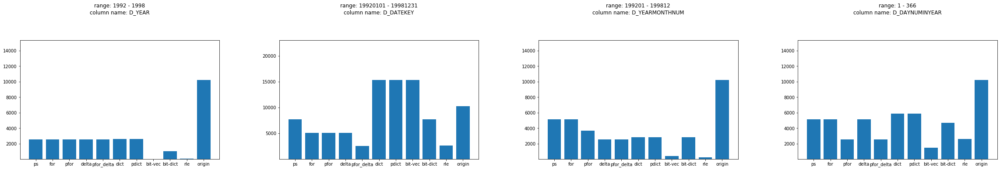

In [56]:
get_plots(16384, [(date_tbl.D_YEAR,4), (date_tbl.D_DATEKEY,4), (date_tbl.D_YEARMONTHNUM,4), (date_tbl.D_DAYNUMINYEAR,4)])
#get_hists([date_tbl.D_YEAR, date_tbl.D_DATEKEY, date_tbl.D_YEARMONTHNUM, date_tbl.D_DAYNUMINYEAR])

In [0]:
def page_dict_vs_full(page_size, columns):
  fig, axarr = plt.subplots(len(columns), 2, figsize=(20,20))
  fig.subplots_adjust(hspace=0.8, wspace=0.3)
  for i in range(len(columns)):
    c,type_size = columns[i]
    labels = ['dict', 'pdict', 'bit-dict', 'origin']
    x = np.arange(len(labels))
    name = c.name
    c = c.values
    algos = [dict_volume, pdict_volume, bit_dict_volume]
    page_level_sizes = [page_level_compression(f, page_size, type_size, c) for f in algos]
    column_level_sizes = [f(type_size, c) for f in algos]

    page_level_sizes.append(type_size*len(c))
    column_level_sizes.append(type_size*len(c))
    axarr[i,0].set_xticks(x)
    axarr[i,0].set_xticklabels(labels)
    axarr[i,0].set_ylim(10,3*np.max(page_level_sizes)/2)
    axarr[i,0].bar(x, page_level_sizes)   
    axarr[i,0].set_title('page_level\nrange: '+str(np.min(c))+" - "+str(np.max(c))+"\ncolumn name: "+name, y=1.2)
    axarr[i,1].set_xticks(x)
    axarr[i,1].set_xticklabels(labels)
    axarr[i,1].set_ylim(10,3*np.max(column_level_sizes)/2)
    axarr[i,1].bar(x, column_level_sizes)   
    axarr[i,1].set_title('column_level\nrange: '+str(np.min(c))+" - "+str(np.max(c))+"\ncolumn name: "+name, y=1.2)

In [0]:
#column size smaller than page size, no diff
#page_dict_vs_full(16384, [(date_tbl.D_YEAR,4), (date_tbl.D_DATEKEY,4), (date_tbl.D_YEARMONTHNUM,4), (date_tbl.D_DAYNUMINYEAR,4)])

**ps** и **for** на SSB Lineorder (scale factor 2, 1.2GB)

In [40]:
column_names = ['lo_orderkey', 'lo_linenumber', 'lo_custkey', 'lo_partkey', 'lo_suppkey', 'lo_orderdate', 'lo_orderpriority', 'lo_shippriority', 'lo_quantity', 'lo_extendedprice',
                'lo_ordertotalprice', 'lo_discount', 'lo_revenue', 'lo_supplycost', 'lo_tax', 'lo_commitdate', 'lo_shipmode','']
lineorder_tbl = pd.read_csv('lineorder.tbl', sep='|\n', delimiter='|', header=None, names=column_names)
lineorder_tbl = lineorder_tbl.drop(columns='')[:5000]
print(lineorder_tbl.info())
lineorder_tbl

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 17 columns):
lo_orderkey           5000 non-null int64
lo_linenumber         5000 non-null int64
lo_custkey            5000 non-null int64
lo_partkey            5000 non-null int64
lo_suppkey            5000 non-null int64
lo_orderdate          5000 non-null int64
lo_orderpriority      5000 non-null object
lo_shippriority       5000 non-null int64
lo_quantity           5000 non-null int64
lo_extendedprice      5000 non-null int64
lo_ordertotalprice    5000 non-null int64
lo_discount           5000 non-null int64
lo_revenue            5000 non-null int64
lo_supplycost         5000 non-null int64
lo_tax                5000 non-null int64
lo_commitdate         5000 non-null int64
lo_shipmode           5000 non-null object
dtypes: int64(15), object(2)
memory usage: 664.2+ KB
None


,lo_orderkey,lo_linenumber,lo_custkey,lo_partkey,lo_suppkey,lo_orderdate,lo_orderpriority,lo_shippriority,lo_quantity,lo_extendedprice,lo_ordertotalprice,lo_discount,lo_revenue,lo_supplycost,lo_tax,lo_commitdate,lo_shipmode
0,1,1,36473,155190,1655,19960130,2-HIGH,0,17,2116823,10523209,4,2032150,74711,2,19960311,TRUCK
1,1,2,36473,67310,326,19960130,2-HIGH,0,36,4598316,10523209,9,4184467,76638,6,19960327,MAIL
2,1,3,36473,63700,142,19960130,2-HIGH,0,8,1330960,10523209,10,1197864,99822,2,19960402,REG AIR
3,1,4,36473,2132,1885,19960130,2-HIGH,0,28,2895564,10523209,9,2634963,62047,6,19960427,AIR
4,2,1,41224,106170,2132,19960817,1-URGENT,0,38,4469446,21179418,0,4469446,70570,5,19960930,RAIL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4870,4,49498,5978,1463,19960603,5-LOW,0,4,753588,16434706,3,730980,113038,8,19960714,RAIL
4996,4870,5,49498,70598,1919,19960603,5-LOW,0,36,5646924,16434706,9,5138700,94115,6,19960715,REG AIR
4997,4871,1,52637,176651,3491,19940828,2-HIGH,0,14,2418710,17643557,7,2249400,103659,3,19941014,REG AIR
4998,4871,2,52637,160509,3874,19940828,2-HIGH,0,17,2668150,17643557,7,2481379,94170,3,19941117,AIR


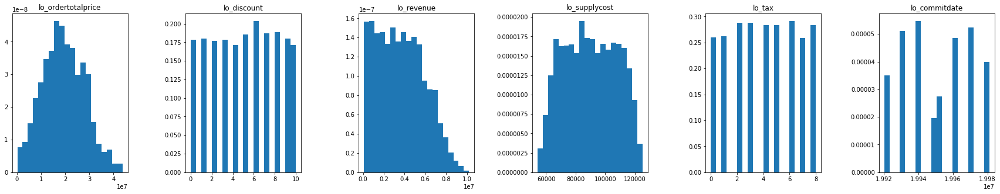

In [41]:
get_hists([lineorder_tbl.lo_ordertotalprice, lineorder_tbl.lo_discount, lineorder_tbl.lo_revenue, lineorder_tbl.lo_supplycost, lineorder_tbl.lo_tax, lineorder_tbl.lo_commitdate	])

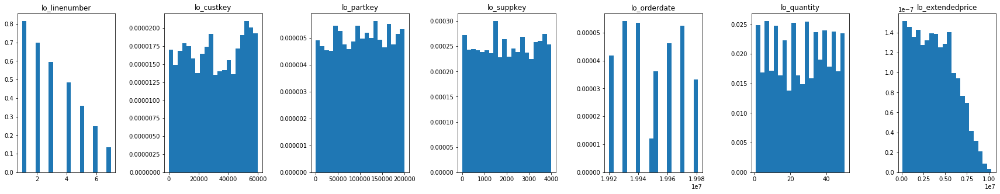

In [42]:
get_hists([lineorder_tbl.lo_linenumber, lineorder_tbl.lo_custkey, lineorder_tbl.lo_partkey, lineorder_tbl.lo_suppkey, lineorder_tbl.lo_orderdate,  lineorder_tbl.lo_quantity,	lineorder_tbl.lo_extendedprice])

[20000, 20002, 16726, 20010, 8673, 13988, 13988, 7338, 10662, 2392]
[15000, 15004, 15004, 20010, 15012, 25000, 25000, 25000, 14325, 5120]


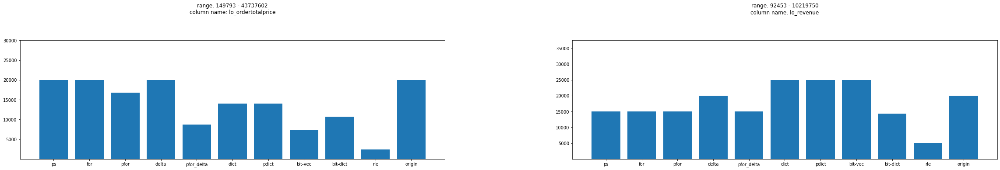

In [43]:
get_plots(16384, [(lineorder_tbl.lo_ordertotalprice,4),(lineorder_tbl.lo_revenue,4)])

[15000, 15004, 10004, 15012, 10010, 23044, 23044, 21740, 14325, 5120]
[15000, 15004, 15004, 20010, 15024, 24970, 24970, 24950, 14325, 5120]


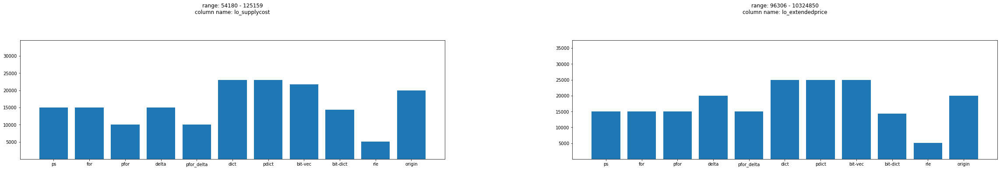

In [44]:
get_plots(16384, [(lineorder_tbl.lo_supplycost,4), (lineorder_tbl.lo_extendedprice,4)])

[20000, 20002, 16726, 20010, 8673, 13988, 13988, 7338, 10662, 2392]
[15000, 15004, 15004, 20010, 15012, 25000, 25000, 25000, 14325, 5120]
[15000, 15004, 10004, 15012, 10010, 23044, 23044, 21740, 14325, 5120]


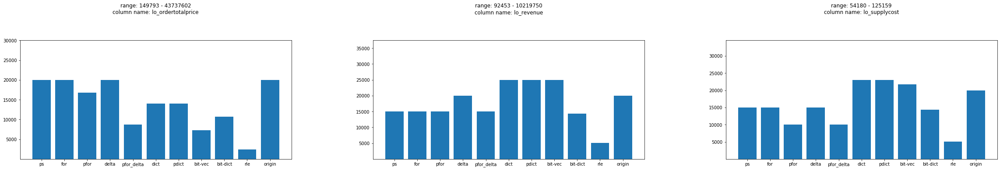

In [45]:
get_plots(16384, [(lineorder_tbl.lo_ordertotalprice,4), (lineorder_tbl.lo_revenue,4), (lineorder_tbl.lo_supplycost,4)])

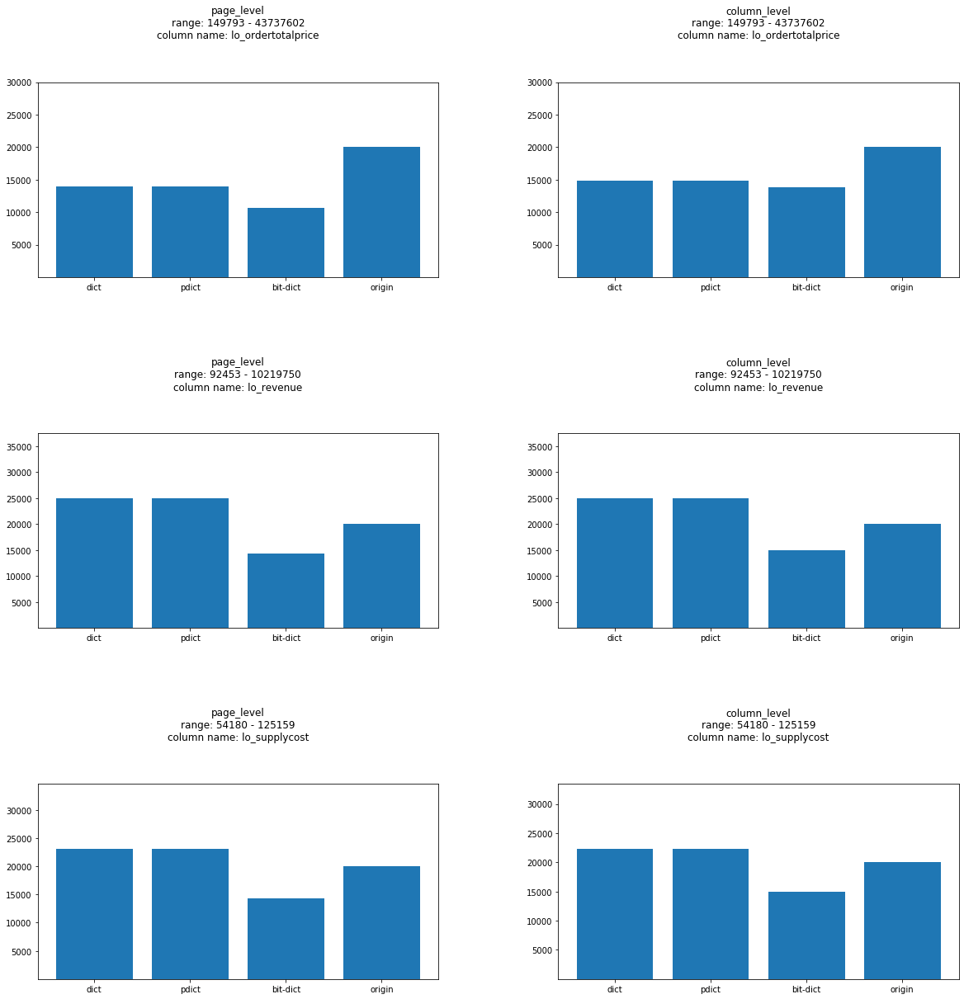

In [46]:
page_dict_vs_full(16384, [(lineorder_tbl.lo_ordertotalprice,4), (lineorder_tbl.lo_revenue,4), (lineorder_tbl.lo_supplycost,4)])

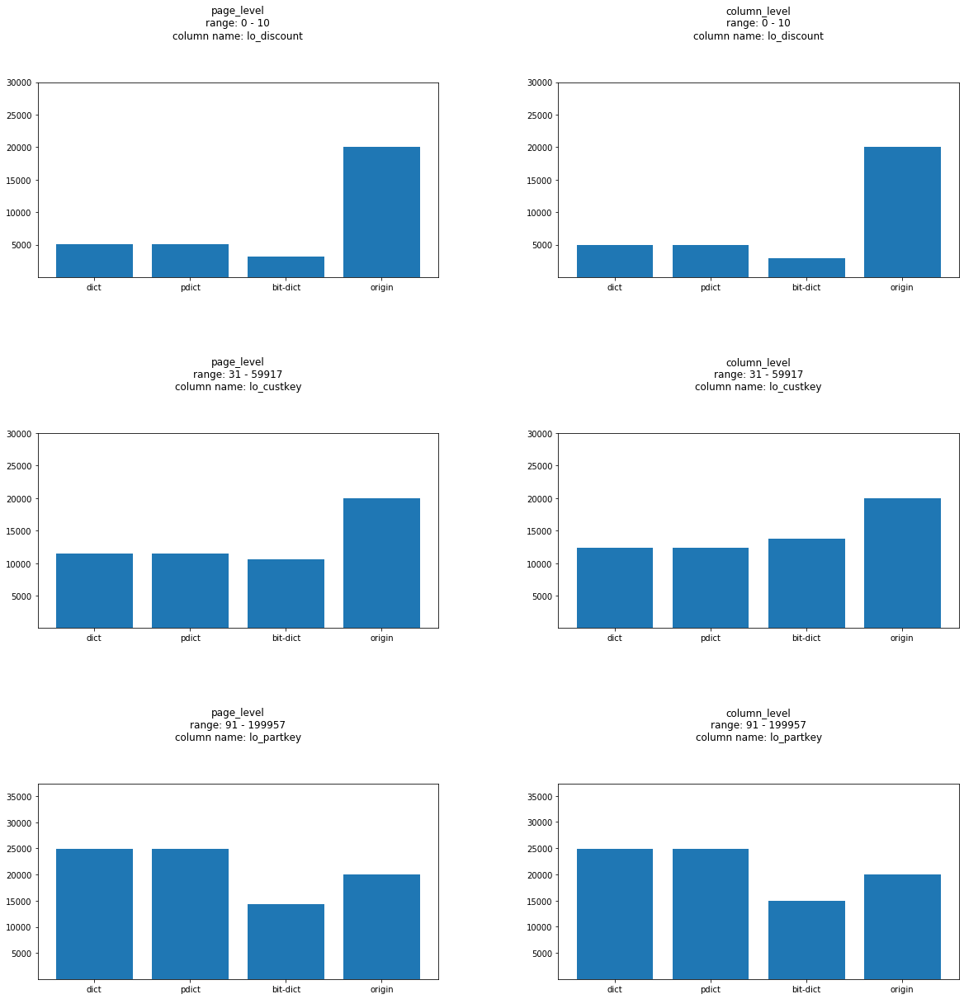

In [47]:
page_dict_vs_full(16384, [(lineorder_tbl.lo_discount,4), (lineorder_tbl.lo_custkey,4), (lineorder_tbl.lo_partkey,4)])

Plots from paper

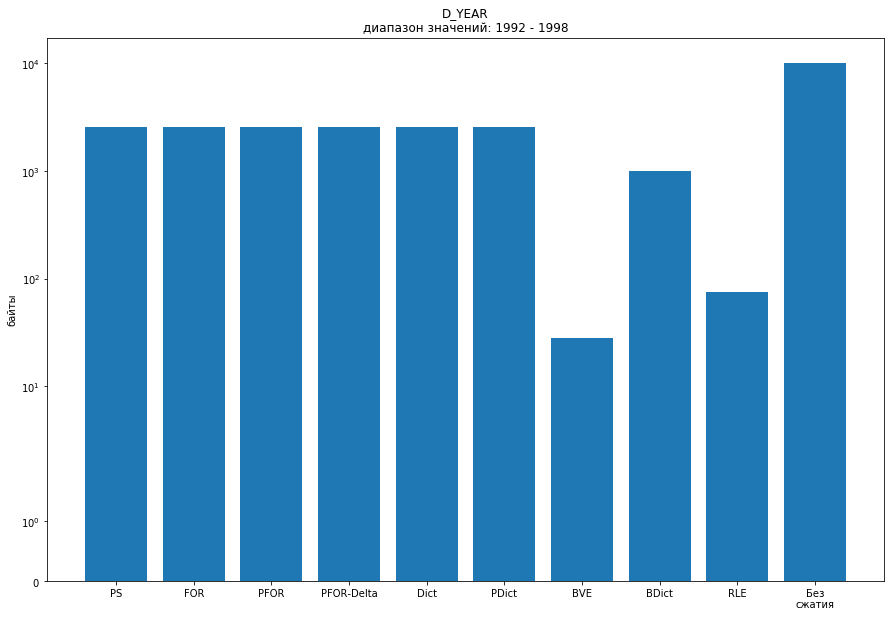

In [57]:
d_year = [2558, 2561, 2559, 2565, 2562, 2571, 2571, 28, 993, 76]
d_datkey = [7672, 5117, 5116, 5121, 2580, 15342, 15342, 15342, 7673, 2617]
d_yearmonthnum = [5115, 5117, 3654, 2565, 2562, 2809, 2809, 420, 2810, 228]
d_daynuminyear = [5114, 5117, 2559, 5121, 2559, 5846, 5846, 1464, 4664, 2617]

labels = ['PS','FOR','PFOR','PFOR-Delta','Dict','PDict','BVE', 'BDict', 'RLE+BWT', 'Без\nсжатия']
vals = [2558, 2561, 2559, 2562, 2571, 2571, 28, 993, 76,10000]
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(15,10))
plt.yscale('symlog')
ax.set_ylim(0,1e+5)
ax.set_ylabel('байты')
ax.set_title('D_YEAR\nдиапазон значений: 1992 - 1998')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.bar(x,vals)

plt.show()

In [48]:
part_tbl = pd.read_csv('part.tbl', sep='|\n', delimiter='|', header=None)
part_tbl

,0,1,2,3,4,5,6,7,8,9
0,1,lace spring,MFGR#1,MFGR#11,MFGR#1121,goldenrod,PROMO BURNISHED COPPER,7,JUMBO PKG,NaN
1,2,rosy metallic,MFGR#1,MFGR#12,MFGR#1218,blush,LARGE BRUSHED BRASS,1,LG CASE,NaN
2,3,green antique,MFGR#4,MFGR#41,MFGR#4110,dark,STANDARD POLISHED BRASS,21,WRAP CASE,NaN
3,4,metallic smoke,MFGR#3,MFGR#35,MFGR#3526,chocolate,SMALL PLATED BRASS,14,MED DRUM,NaN
4,5,blush chiffon,MFGR#3,MFGR#35,MFGR#3510,forest,STANDARD POLISHED TIN,15,SM PKG,NaN
...,...,...,...,...,...,...,...,...,...,...
399995,399996,firebrick peru,MFGR#5,MFGR#54,MFGR#549,blanched,LARGE ANODIZED STEEL,1,LG BAG,NaN
399996,399997,navajo burnished,MFGR#5,MFGR#55,MFGR#5529,salmon,SMALL ANODIZED NICKEL,47,JUMBO PACK,NaN
399997,399998,violet pink,MFGR#2,MFGR#21,MFGR#2139,moccasin,SMALL PLATED BRASS,50,WRAP CAN,NaN
399998,399999,antique mint,MFGR#5,MFGR#54,MFGR#5420,yellow,SMALL BURNISHED BRASS,10,SM PACK,NaN


In [0]:
#DRAFTS

# размер сжатой колонки в байтах при выделении общего префикса у подмассива
#TODO: размер словаря и данных отдельно; попробовать в битах, а не байтах
def partialy_ps_numeric_volume(column):
  column_max = np.max(column) 
  digits_number = int(np.log2(column_max)) + 1 # длина маски
  module = 2**(digits_number) - 1 # модуль для сдвига маски
  mask = module # начальное значение маски
  reversed_mask = mask # развернутая маска для подсчета размера префикса
  compressed_volume = np.inf
  while mask != 0:
    column_prefix = column & mask # применили маску к каждой записи
    max_prefix_cnt = np.max(np.array([len(column_prefix[column_prefix == c]) for c in np.unique(column_prefix)])) # нашли префикс с макс числом вхождений
    # считаем сжатый объем как: размер несжатых записей + размер сжатых + размер списка индексов сжатых
    compressed_volume = min(compressed_volume, (len(column) - max_prefix_cnt)*byte_size_of(column_max) +
                                              max_prefix_cnt*(align_to_byte(len(bin(column_max)) - len(bin(reversed_mask))) + bytes_size_of(len(column))))  
    mask <<= 1
    mask &= module
    reversed_mask >>= 1
  return compressed_volume

# получаемые объемы памяти не всегда монотонно зависят от base, неточный ответ, но быстрее 
def pfor_volume(column):
  m = np.max(column)
  low = np.min(column)-1
  high = m+1
  while low < high-1: # бинпоиск по base на [min, max] в column
    mid = (low + high)//2
    up_mid = (mid + high)//2
    up_under_base = [val for val in column if val < up_mid]
    if len(up_under_base) == 0:
      up_compressed = []
    else:
      up_compressed = len(up_under_base)*byte_size_of(max(up_under_base))
    up_compressed += len([val for val in column if val >= up_mid])*byte_size_of(m - up_mid)
    down_mid = (mid + low)//2
    down_under_base = [val for val in column if val < down_mid]
    if len(down_under_base) == 0:
      down_under_base = []
    else:
      down_compressed = len(down_under_base)*byte_size_of(max(down_under_base))
    down_compressed += len([val for val in column if val >= down_mid])*byte_size_of(m - down_mid)
    if up_compressed > down_compressed:
      high = mid
      compressed_volume = down_compressed
    else:
      low = mid
      compressed_volume = up_compressed
  return compressed_volume  